# Nuclei detection

In [54]:
import tifffile
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.ndimage import gaussian_filter
from scipy.ndimage import median_filter
import skimage as ski
from stardist.models import StarDist2D,StarDist3D
from csbdeep.utils import Path, normalize
import random
import numpy as np
import tensorflow as tf
from scipy import ndimage as ndi
from skimage.feature import peak_local_max
from skimage.feature import blob_dog, blob_log
from skimage.measure import regionprops_table
from cellpose import models, core, io, plot

import warnings

import sys

my_path = Path.cwd().parent.parent / "src"
sys.path.append(str(my_path))

from visualization import visualization 
from detection import stardist_segmentation
from pre_processing import denoising
from utils import utils

%matplotlib inline

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
ROOT = Path(r"K:\users\voland\images\data\TgCetnEos_CenSpark_H2B_4h-24h-48hpf\20260507CFHa_CetnEos_H2BmCherry_CS_48hpf\3e3")

VOL_PATH = ROOT/"original"/"20260507CFHa_CetnEos_H2BmCherry_CS_48hpf.lif - 3e3.tif"

STARDIST_UNET_MODEL_PATH = r"K:\users\voland\code\Zfish_Centrioles_Tracking_Pipeline\models\stardist\unet_model"
STARDIST_EARLY_EMBRYO_MOUSE_MODEL_PATH = r"K:\users\voland\code\Zfish_Centrioles_Tracking_Pipeline\models\stardist\early_embryo_model"
STARDIST_LATE_BLASTO_MOUSE_MODEL_PATH = r"K:\users\voland\code\Zfish_Centrioles_Tracking_Pipeline\models\stardist\late_blastocyst_model"
STARDIST_GO_NUCLEAR_MODEL_PATH = r"K:\users\voland\code\Zfish_Centrioles_Tracking_Pipeline\models\stardist\generic_plant_nuclei_3D"


## Data loading

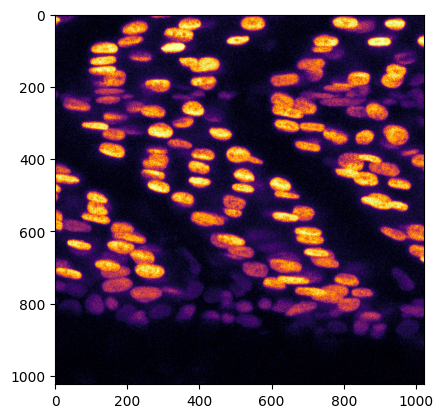

In [3]:
vol = tifffile.memmap(VOL_PATH)
(z,c,y,x) = vol.shape

z_range = slice(50,70)
nuclei_frame = vol[z_range,1]
zmax_vol_nulcei = np.max(nuclei_frame,axis=0)
plt.imshow(zmax_vol_nulcei, cmap="inferno")

In [4]:
print(f"Image shape: {nuclei_frame.shape} \n")

nuclei_intensities = nuclei_frame.flatten()

print("mCherry intensity metrics:")
print(f"Min value: {nuclei_intensities.min()}")
print(f"Max value: {nuclei_intensities.max()}")
print(f"Mean value: {nuclei_intensities.mean():.1f}")
print(f"Median value: {np.median(nuclei_intensities):.1f} \n")

Image shape: (20, 1024, 1024) 

mCherry intensity metrics:
Min value: 1
Max value: 255
Mean value: 14.3
Median value: 1.0 



In [5]:
resolution = utils.get_pixel_size(VOL_PATH)
resolution

array([0.56839046, 0.15128799, 0.15128799])

## Nuclei segmentation

### Stardist segmentation

Let's first normalise the image

Normalized image range: 0.0 - 1.0854700803756714


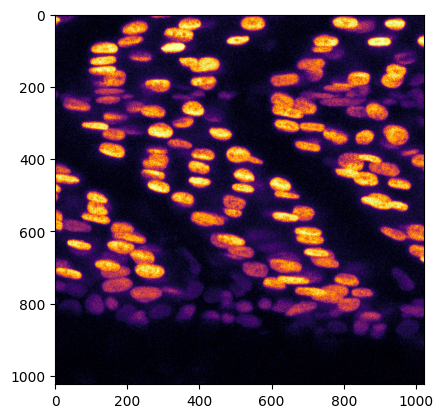

In [6]:
norm_nuclei_frame = stardist_segmentation.normalizes_frame(nuclei_frame)
print(f"Normalized image range: {norm_nuclei_frame.min()} - {norm_nuclei_frame.max()}")
zmax_norm_nuclei_frame = np.max(norm_nuclei_frame, axis=0)
plt.imshow(zmax_norm_nuclei_frame, cmap="inferno")

#### 3D Demo model

We plan on starting with the 3D demo model.

In [31]:
stardist3Dmodel_scale = [0.5,0.5,0.5]
demo_scale = resolution/stardist3Dmodel_scale
demo_scale 

array([1.13678092, 0.30257598, 0.30257598])

In [ ]:
[demo_labels, demo_polys] = stardist_segmentation.segment_frame(frame = norm_nuclei_frame,
                                                      proba_thresh = 0.4, 
                                                      scale = demo_scale
                                                      )
print(f"{len(demo_polys['points'])} spots detected")

Found model '3D_demo' for 'StarDist3D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.707933, nms_thresh=0.3.


100%|██████████| 81/81 [00:09<00:00,  8.82it/s]


198 spots detected


(-0.5, 1023.5, 1023.5, -0.5)

<Figure size 800x800 with 0 Axes>

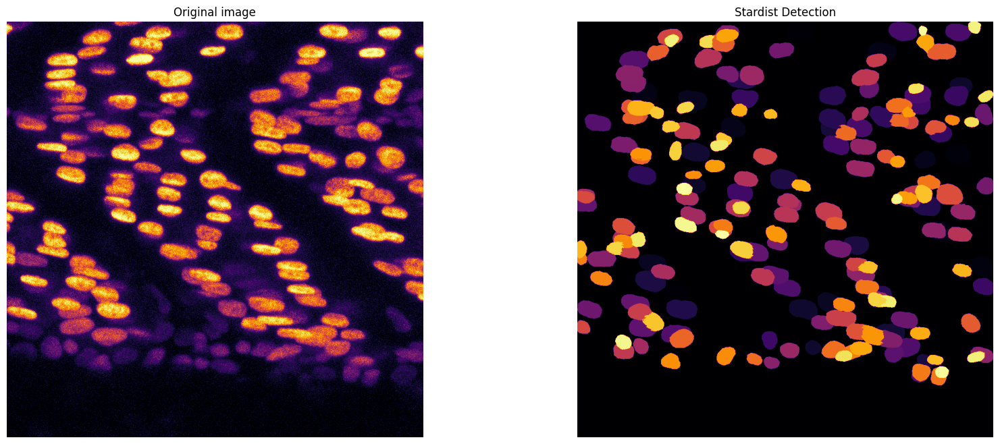

In [30]:
demo_labels_zmax = np.max(demo_labels, axis=0)
plt.figure(figsize=(8,8))

zmax_test = np.max(norm_nuclei_frame,axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(zmax_test, cmap="inferno")
axes[0].set_title("Original image")
axes[0].axis("off")

plt.imshow(demo_labels_zmax, cmap="inferno")
axes[1].set_title("Stardist Detection")
axes[1].axis("off")

In [32]:
low_nuclei_frame = nuclei_frame/2

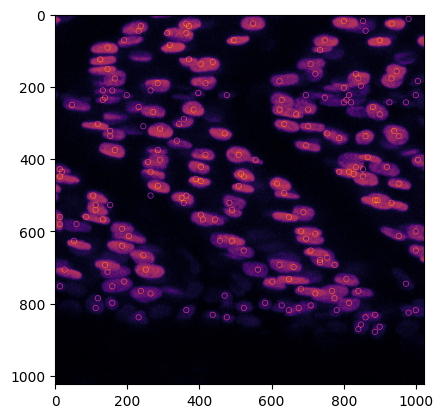

In [33]:
demo_stardist_frame_detection = visualization.draw_circles(stack = low_nuclei_frame,centers = demo_polys["points"])

zmax_demo_stardist_frame_detection = np.max(demo_stardist_frame_detection, axis=0)

plt.imshow(zmax_demo_stardist_frame_detection, cmap="inferno")

The 3D demo model doesn't really lead to promising results. 

#### Florian's Unet model
Let's try the same model as Florian did.

In [ ]:
unet_scale = resolution/np.array([0.122,0.116,0.116])
unet_scale = unet_scale/unet_scale.max()
unet_scale

array([4.65893818, 1.30420681, 1.30420681])

In [75]:
[unet_labels, unet_polys] = stardist_segmentation.segment_frame(frame = norm_nuclei_frame,
                                                      model_path = STARDIST_UNET_MODEL_PATH,
                                                      proba_thresh = 0.5, 
                                                      scale = unet_scale
                                                      )
print(f"{len(unet_polys['points'])} spots detected")

base_model.py (163): Couldn't find any network weights (*.h5, *.hdf5) to load.


Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.557727, nms_thresh=0.3.


100%|██████████| 64/64 [00:15<00:00,  4.22it/s]


161634 spots detected


(-0.5, 1023.5, 1023.5, -0.5)

<Figure size 800x800 with 0 Axes>

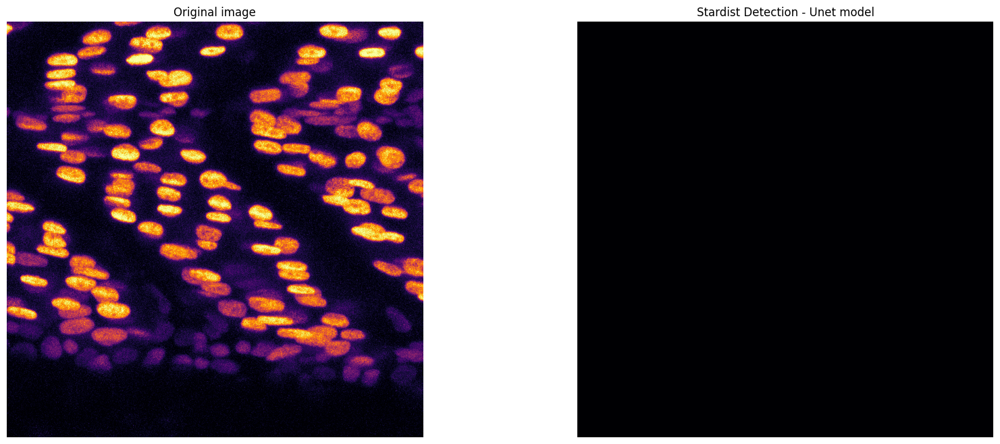

In [76]:
unet_labels_zmax = np.max(unet_labels, axis=0)
plt.figure(figsize=(8,8))

zmax_test = np.max(norm_nuclei_frame,axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(zmax_test, cmap="inferno")
axes[0].set_title("Original image")
axes[0].axis("off")

plt.imshow(unet_labels_zmax, cmap="inferno")
axes[1].set_title("Stardist Detection - Unet model")
axes[1].axis("off")

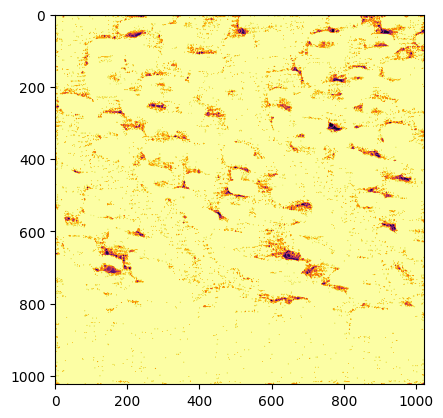

In [77]:
unet_stardist_frame_detection = visualization.draw_circles(stack = low_nuclei_frame,centers = unet_polys["points"])
zmax_unet_stardist_frame_detection = np.max(unet_stardist_frame_detection, axis=0)
plt.imshow(zmax_unet_stardist_frame_detection, cmap="inferno")

Don't really work either.

### Early embryo model from BlastoSPIM

In [37]:
early_embryo_res = np.array([2.0, 0.208, 0.208])
early_embryo_scale = resolution/early_embryo_res
early_embryo_scale

array([0.28419523, 0.72734611, 0.72734611])

In [40]:
[early_blasto_labels, early_blasto_polys] = stardist_segmentation.segment_frame(frame = norm_nuclei_frame,
                                                      model_path = STARDIST_EARLY_EMBRYO_MOUSE_MODEL_PATH,
                                                      proba_thresh = 0.2, 
                                                      scale = early_embryo_scale
                                                      )
print(f"{len(early_blasto_polys['points'])} spots detected")

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|██████████| 16/16 [00:01<00:00,  8.58it/s]


136 spots detected


(-0.5, 1023.5, 1023.5, -0.5)

<Figure size 800x800 with 0 Axes>

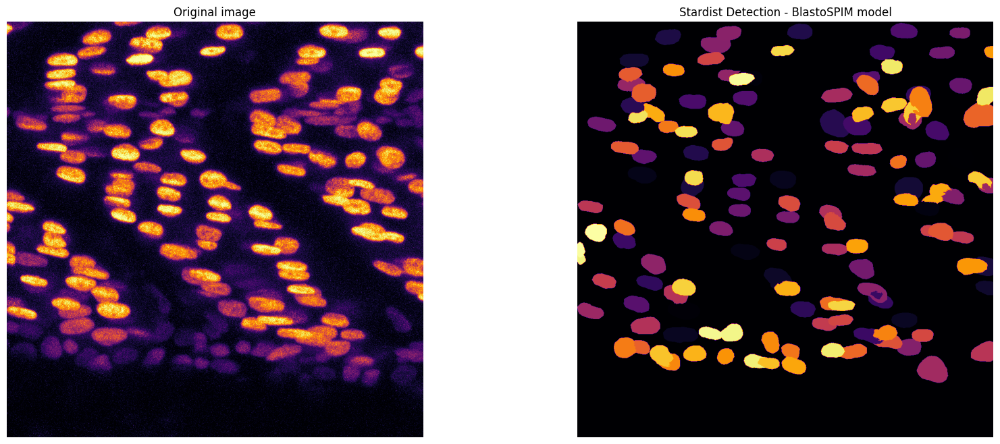

In [ ]:
early_blasto_labels_zmax = np.max(early_blasto_labels, axis=0)
plt.figure(figsize=(8,8))

zmax_test = np.max(norm_nuclei_frame,axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(zmax_test, cmap="inferno")
axes[0].set_title("Original image")
axes[0].axis("off")

plt.imshow(early_blasto_labels_zmax, cmap="inferno")
axes[1].set_title("Stardist Detection - Early BlastoSPIM model")
axes[1].axis("off")

### Late blastocyte model from BlastoSPIM

In [39]:
late_blasto_res = np.array([2.0, 0.208, 0.208])
late_blasto_scale = resolution/late_blasto_res
late_blasto_scale

array([0.28419523, 0.72734611, 0.72734611])

In [ ]:
[late_blasto_labels, late_blasto_polys] = stardist_segmentation.segment_frame(frame = norm_nuclei_frame,
                                                      model_path = STARDIST_LATE_BLASTO_MOUSE_MODEL_PATH,
                                                      proba_thresh = 0.2, 
                                                      scale = late_blasto_scale
                                                      )
print(f"{len(late_blasto_polys['points'])} spots detected")

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.531428, nms_thresh=0.3.


100%|██████████| 16/16 [00:02<00:00,  7.49it/s]


141 spots detected


In [ ]:
[late_blasto_labels, late_blasto_polys] = stardist_segmentation.segment_frame(frame = norm_nuclei_frame,
                                                      model_path = STARDIST_LATE_BLASTO_MOUSE_MODEL_PATH,
                                                      proba_thresh = 0.2, 
                                                      scale = late_blasto_scale
                                                      )
print(f"{len(late_blasto_polys['points'])} spots detected")

(-0.5, 1023.5, 1023.5, -0.5)

<Figure size 800x800 with 0 Axes>

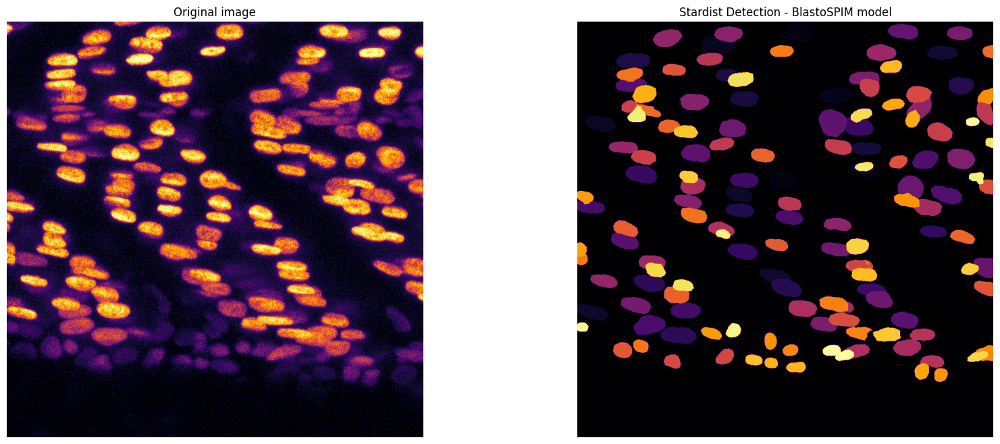

In [ ]:
late_blasto_labels_zmax = np.max(late_blasto_labels, axis=0)
plt.figure(figsize=(8,8))

zmax_test = np.max(norm_nuclei_frame,axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(zmax_test, cmap="inferno")
axes[0].set_title("Original image")
axes[0].axis("off")

plt.imshow(late_blasto_labels_zmax, cmap="inferno")
axes[1].set_title("Stardist Detection - BlastoSPIM model")
axes[1].axis("off")

Quite good as well.

### Go nuclear

The go_nuclear script get the model from a zoo.yaml file. In my case I would like to get the weight and the config file from the model.

In [63]:
go_nucl_scale = [1, 1,0.5]

In [72]:
[go_nuclear_labels, go_nuclear_polys] = stardist_segmentation.segment_frame(frame = norm_nuclei_frame,
                                                      model_path = STARDIST_GO_NUCLEAR_MODEL_PATH,
                                                      proba_thresh = 0.1,
                                                      scale = go_nucl_scale
                                                      )
print(f"{len(go_nuclear_polys['points'])} spots detected")

Loading network weights from 'weights_bioimageio.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.505612, nms_thresh=0.3.


100%|██████████| 36/36 [00:05<00:00,  6.81it/s]


153 spots detected


(-0.5, 1023.5, 1023.5, -0.5)

<Figure size 800x800 with 0 Axes>

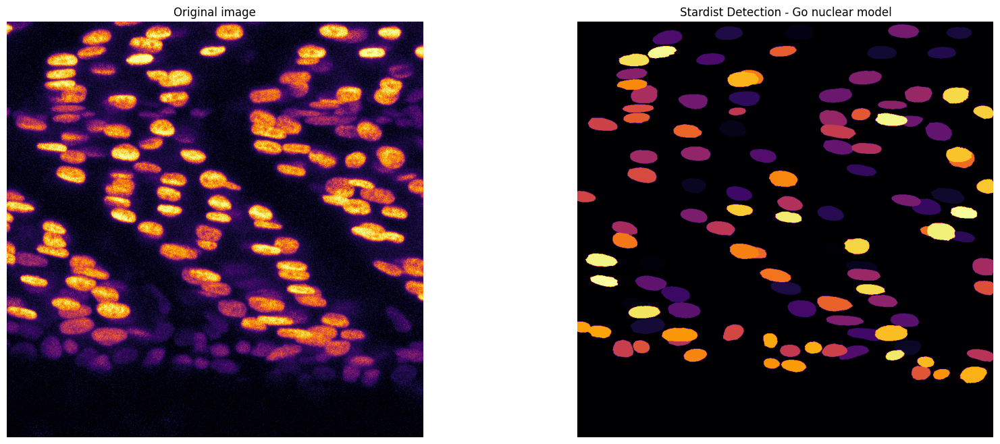

In [73]:
late_blasto_labels_zmax = np.max(late_blasto_labels, axis=0)
plt.figure(figsize=(8,8))

zmax_test = np.max(norm_nuclei_frame,axis=0)

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(zmax_test, cmap="inferno")
axes[0].set_title("Original image")
axes[0].axis("off")

plt.imshow(late_blasto_labels_zmax, cmap="inferno")
axes[1].set_title("Stardist Detection - Go nuclear model")
axes[1].axis("off")

Very good and promising

#### 2D model
Potentially we can also try in 2D.

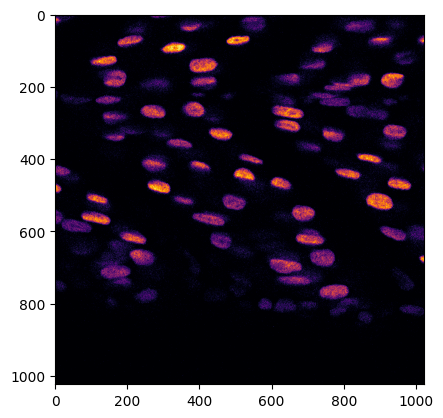

In [70]:
selected_slice = 2
img_nuclei = nuclei_frame[selected_slice]
plt.imshow(img_nuclei, cmap="inferno")

Range of normalized image: 0.0 - 1.0


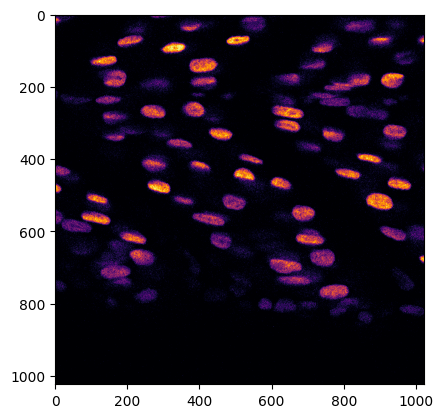

In [65]:
norm_img_nuclei = normalize(img_nuclei,clip = True)
print(f"Range of normalized image: {norm_img_nuclei.min()} - {norm_img_nuclei.max()}")
plt.imshow(norm_img_nuclei, cmap = "inferno")

In [68]:
model = StarDist2D.from_pretrained("2D_versatile_fluo")
labels_2d, polys_2d = model.predict_instances(
    norm_img_nuclei,  # The image must be normalized
    axes="YX",
    return_labels=True,
    prob_thresh = 0.3
)

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


(-0.5, 1023.5, 1023.5, -0.5)

<Figure size 800x800 with 0 Axes>

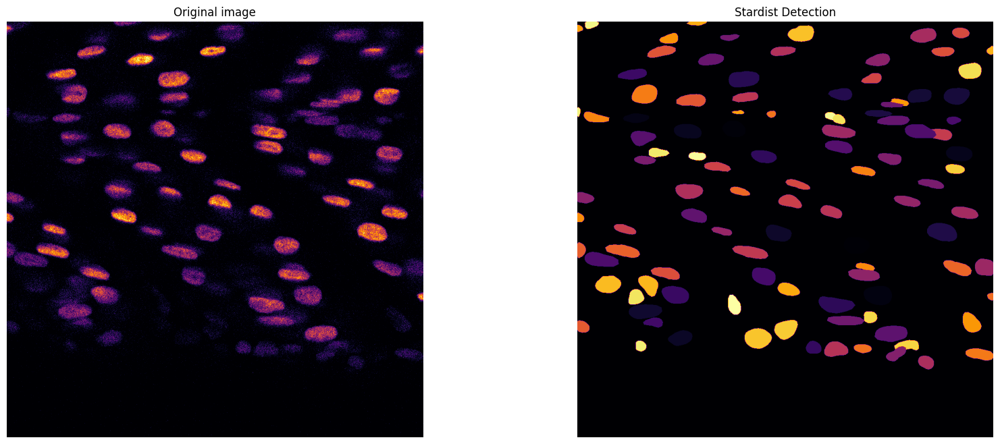

In [69]:
plt.figure(figsize=(8,8))

fig, axes = plt.subplots(1,2, figsize=(20,8))
axes[0].imshow(img_nuclei, cmap="inferno")
axes[0].set_title("Original image")
axes[0].axis("off")

plt.imshow(labels_2d, cmap="inferno")
axes[1].set_title("Stardist Detection")
axes[1].axis("off")

Not too bad

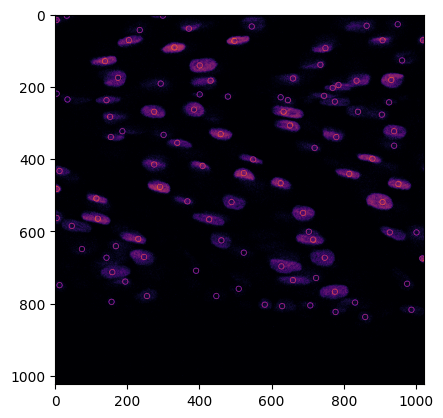

In [71]:
stardist_img_detection = visualization.draw_circles2D(img = low_nuclei_frame[selected_slice],centers = polys_2d["points"])
plt.imshow(stardist_img_detection, cmap="inferno")

2D detection works quite well, however we really need a way to work with 3D data.

Some function allow 3D reconstruction based on 2D segmentation.

In [ ]:
stardist_seg_frame = np.empty(nuclei_frame.shape)
for z in range(len(nuclei_frame)):
    norm_img_nuclei = normalize(nuclei_frame[z],clip = True)

    stardist_seg_frame[z],_ =  model.predict_instances(
        norm_img_nuclei,  # The image must be normalized
        axes="YX",
        return_labels=True,
        prob_thresh = 0.3
    )

In [73]:
stardist_seg_frame = stardist_seg_frame.astype(np.uint8)
props = regionprops_table(stardist_seg_frame, nuclei_frame,
                          properties=['label', 'inertia_tensor',
                                       'centroid'])
props

{'label': array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
         14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
         27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
         40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
         53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
         66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
         79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
         92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
        105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
        118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
        131, 132, 133, 134]),
 'inertia_tensor-0-0': array([1.15488732e+05, 1.34217144e+05, 1.20851823e+05, 1.51993101e+05,
        1.24612550e+05, 1.41595212e+05, 1.03958886e+05, 1.23971081e+05,
        1.14346706e+05, 1.21963799e+05, 1.04708463e+05, 1.4481266

In [74]:
centers = np.stack([props["centroid-0"],props["centroid-1"],props["centroid-2"]],axis=1).astype(int)
centers

array([[  9, 493, 513],
       [  9, 395, 423],
       [  9, 447, 559],
       [  9, 426, 509],
       [  8, 431, 616],
       [  9, 397, 518],
       [  9, 541, 513],
       [  8, 494, 576],
       [  9, 465, 515],
       [  9, 376, 516],
       [  9, 279, 479],
       [  9, 355, 435],
       [  8, 357, 541],
       [  9, 367, 448],
       [  9, 420, 483],
       [  7, 530, 599],
       [  9, 423, 609],
       [  9, 419, 466],
       [  8, 422, 521],
       [  8, 324, 459],
       [ 10, 413, 440],
       [  9, 410, 464],
       [  9, 351, 616],
       [  9, 366, 425],
       [  9, 335, 547],
       [  9, 335, 487],
       [  9, 441, 527],
       [  9, 620, 587],
       [  8, 449, 583],
       [  9, 413, 496],
       [  9, 438, 597],
       [  9, 435, 505],
       [  9, 445, 501],
       [  9, 318, 362],
       [  9, 430, 622],
       [  9, 349, 551],
       [  9, 510, 514],
       [  9, 487, 531],
       [  9, 369, 528],
       [  9, 373, 516],
       [  9, 462, 604],
       [  8, 405

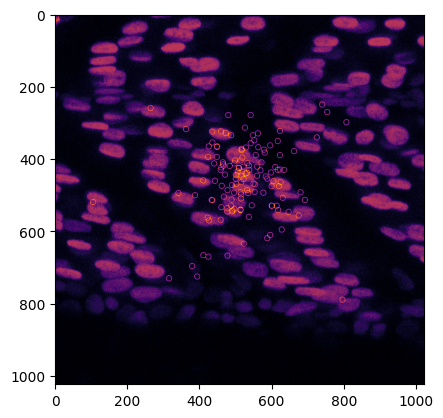

In [76]:
regionprops_frame = visualization.draw_circles(low_nuclei_frame,centers = centers)
zmax_regionprops_frame = np.max(regionprops_frame, axis=0)
plt.imshow(zmax_regionprops_frame, cmap="inferno")

Don't really work either

## Local Maxima

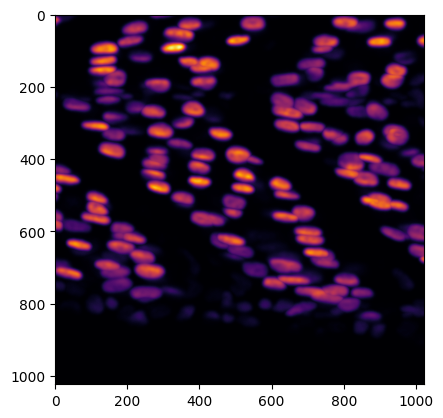

In [78]:
blurr_nuclei_frame = gaussian_filter(nuclei_frame,sigma=4)
zmax_blurr_nuclei_frame = np.max(blurr_nuclei_frame, axis=0)
plt.imshow(zmax_blurr_nuclei_frame, cmap="inferno")

In [85]:
coordinates = peak_local_max(blurr_nuclei_frame,  footprint= np.ones((40,) * blurr_nuclei_frame.ndim),min_distance=5)
print(f"Number of nuclei detected {len(coordinates)}")

Number of nuclei detected 51


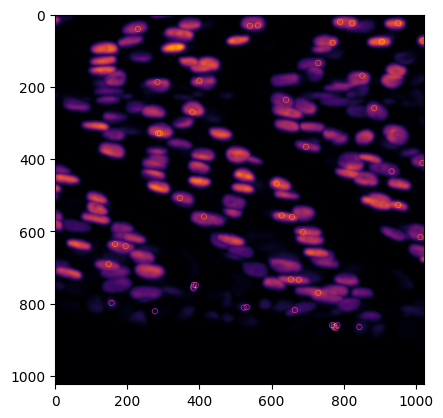

In [86]:
unet_stardist_frame_detection = visualization.draw_circles(stack = blurr_nuclei_frame,centers = coordinates)

zmax_unet_stardist_frame_detection = np.max(unet_stardist_frame_detection, axis=0)

plt.imshow(zmax_unet_stardist_frame_detection, cmap="inferno")

## Blob detection

In [ ]:
blobs_dogs = blob_log(nuclei_frame, min_sigma =7, max_sigma = 10, threshold=0.01)
print(f"Number of blob detected {len(blobs_dogs)}")

Number of blob detected 347


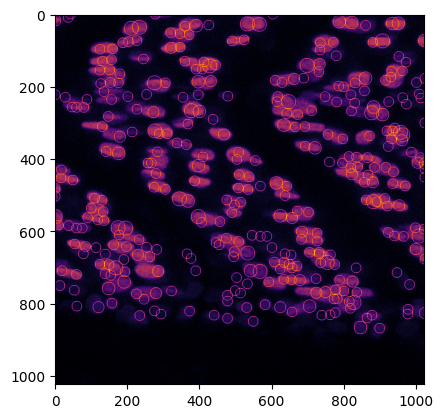

In [88]:
dogs_radius =  blobs_dogs[:,-1]
unet_stardist_frame_detection = visualization.draw_circles(stack = low_nuclei_frame,centers = blobs_dogs[:,:3], radius =dogs_radius)

zmax_unet_stardist_frame_detection = np.max(unet_stardist_frame_detection, axis=0)
plt.imshow(zmax_unet_stardist_frame_detection, cmap="inferno")

In [89]:
print(f"Radius mean {np.mean(dogs_radius)}")
print(f"Radius median {np.median(dogs_radius)}")
np.unique(dogs_radius)

Radius mean 7.504322766570605
Radius median 7.0


array([ 7.        ,  7.33333333,  7.66666667,  8.        ,  8.33333333,
        8.66666667,  9.        ,  9.33333333,  9.66666667, 10.        ])

Ok but not super duper efficient

In [95]:
blobs_logs = blob_dog(median_nuclei_frame, min_sigma =7, max_sigma = 10, threshold=0.01)
print(f"Number of blob detected {len(blobs_logs)}")

Number of blob detected 270


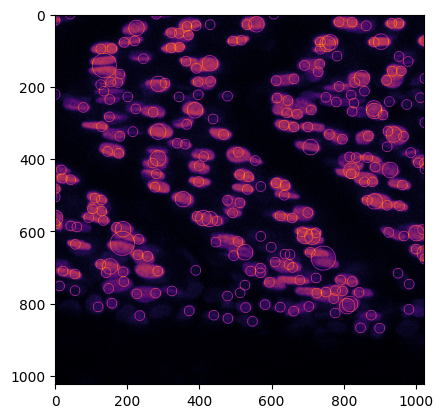

In [94]:
logs_radius =  blobs_logs[:,-1]
unet_stardist_frame_detection = visualization.draw_circles(stack = low_nuclei_frame,centers = blobs_logs[:,:3], radius =logs_radius)

zmax_unet_stardist_frame_detection = np.max(unet_stardist_frame_detection, axis=0)

plt.imshow(zmax_unet_stardist_frame_detection, cmap="inferno")

In [97]:
print(f"Radius mean {np.mean(logs_radius)}")
print(f"Radius median {np.median(logs_radius)}")
np.unique(logs_radius)

Radius mean 7.63408560311284
Radius median 7.0


array([ 7.  , 11.2 , 17.92])

In [98]:
img_bg = gaussian_filter(norm_nuclei_frame, sigma=20)
norm_frame = np.clip(norm_nuclei_frame - img_bg, 0, None)

In [99]:
blobs = blob_dog(
    median_nuclei_frame,
    min_sigma=[3, 3, 7],   # [z_sigma, y_sigma, x_sigma]
    max_sigma=[5, 5, 10],
    threshold=0.05,
    overlap=0.3
)

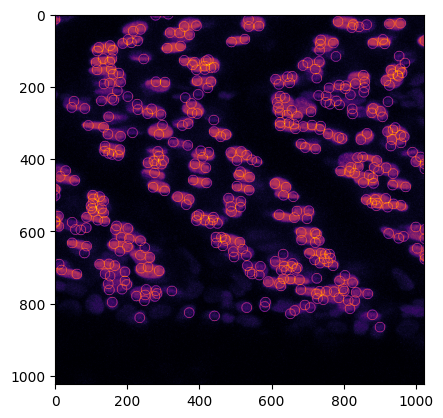

In [100]:
dogs_radius =  blobs[:,-1]
unet_stardist_frame_detection = visualization.draw_circles(stack = low_nuclei_frame,centers = blobs[:,:3], radius =dogs_radius)

zmax_unet_stardist_frame_detection = np.max(unet_stardist_frame_detection, axis=0)
plt.imshow(zmax_unet_stardist_frame_detection, cmap="inferno")